# Analyse XBeach outputs across different reef morphologies

In [2]:
import os
import glob
import h5py
import netCDF4
import numpy as np
from operator import sub
from scipy import signal
from scipy import interpolate
from scipy.interpolate import interp1d
from scipy.signal import savgol_filter

import matplotlib

import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.cm as cm
from mpl_toolkits.axes_grid1 import make_axes_locatable

import xarray as xr

%matplotlib inline

# display plots in SVG format
%config InlineBackend.figure_format = 'svg' 

## Load XBeach output data

In [4]:
nc_data = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex1\ex1_m_SB.nc')
nc_data2 = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex1\ex1_m_2.5_SB.nc')
nc_data8 = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex1\ex1_m_8.5_SB.nc')
nc_dataTD = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex1\ex1_m_TD_SB.nc')

nc_dataB = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex2\ex2_M_SB.nc')
nc_data2B = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex2\ex2_m_2.5_SB.nc')
nc_data8B= netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex2\ex2_m_8.5_SB.nc')
nc_dataTDB = netCDF4.Dataset(r'D:\XBeach_outputs\SB\ex2\ex2_m_TD_SB.nc')


OS_data = [nc_data, nc_data2, nc_data8, nc_dataTD]
OE_data = [nc_dataB, nc_data2B, nc_data8B, nc_dataTDB]



# Print the variables
print(nc_data.variables.keys())

dict_keys(['parameter', 'globalx', 'globaly', 'globaltime', 'zb', 'zs', 'u', 'v', 'H', 'Fx', 'Fy', 'E', 'D', 'wscrit', 'Sxx', 'Sxy', 'Syy', 'c', 'L1', 'cg', 'urms', 'Df', 'pointtime', 'pointx', 'pointy', 'station_id', 'xpointindex', 'ypointindex', 'pointtypes', 'point_zs', 'point_H', 'point_u', 'point_v', 'point_Fx', 'point_Fy', 'point_E', 'point_D', 'point_wscrit', 'meantime', 'u_mean', 'u_var', 'u_min', 'u_max'])


## Plotting Bed Profiles

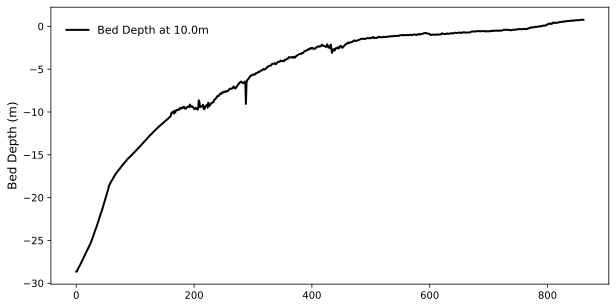

<Figure size 5120x3840 with 0 Axes>

In [5]:
# The y-axis varies between 0 and 80 base on the shape of the arrays:
yp = 10 # Here I chose the middle of the domain 

def plot_bed_profile(data,yp):

    ZB = data.variables['zb'][0,yp,:]
    ypos = data.variables['globaly'][yp,0]
    fig, ax1 = plt.subplots(figsize=(10,5))
    ax1.plot(ZB, 'black', label='Bed Depth at '+str(ypos)+'m', linewidth=2)
    ax1.set_ylabel('Bed Depth (m)', size=12)
    ax1.tick_params(axis='x', labelsize=10)
    ax1.tick_params(axis='y', labelsize=10)

    ax1.legend(loc = (0.02,0.88), fontsize=11, frameon = False)
    plt.figure(dpi=800)
    plt.show()
    
    return

plot_bed_profile(nc_data, yp)

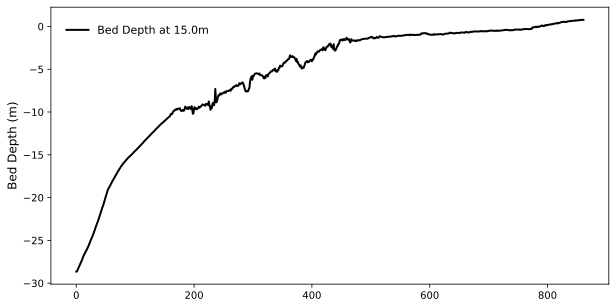

<Figure size 5120x3840 with 0 Axes>

In [6]:
yp = 15 # I can choose another position by changing yp between 0 and 80...
plot_bed_profile(nc_data, yp)

## Plot Dissipation for each CC outcome

85.0


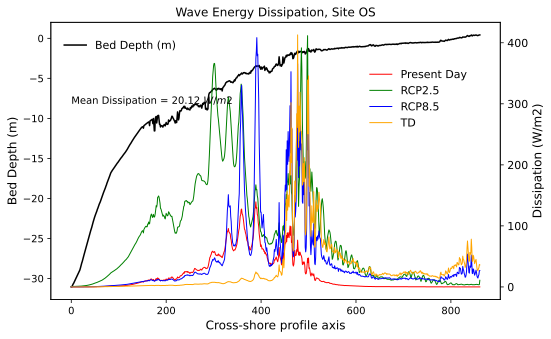

<Figure size 5120x3840 with 0 Axes>

In [7]:
# use y midpoint:

ylength = nc_data.variables['zs'].shape[1]

yp = ylength/2

print (yp)

xlength = nc_data.variables['zs'].shape[2]

zb = nc_data.variables['zb'][0,yp,:]



D = nc_data.variables['D'][:,yp,:]
D2 = nc_data2.variables['D'][:,yp,:]
D3 = nc_data8.variables['D'][:,yp,:]
D4 = nc_dataTD.variables['D'][:,yp,:]

Df = nc_data.variables['Df'][:,yp,:]
Df2 = nc_data2.variables['Df'][:,yp,:]
Df3 = nc_data8.variables['Df'][:,yp,:]
Df4 = nc_dataTD.variables['Df'][:,yp,:]

sumD = np.amax(D,axis=0) + np.amax(Df,axis=0)
sumD2 = np.amax(D2,axis=0) + np.amax(Df2,axis=0)
sumD3 = np.amax(D3,axis=0) + np.amax(Df3,axis=0)
sumD4 = np.amax(D4,axis=0) + np.amax(Df4,axis=0)



    
def make_patch_spines_invisible(ax):
    ax.set_frame_on(True)
    ax.patch.set_visible(False)
    for sp in ax.spines.values():
        sp.set_visible(False)



    
def plot_D_profile(sumD, zb, sumD2, sumD3, sumD4):
    
    fig, ax1 = plt.subplots(figsize=(10,5), sharey = 'all')
    fig.subplots_adjust(right=0.75)##
    ax2 = ax1.twinx()
    
    ax2.plot(sumD, 'red', label='Present Day', linewidth=1)
    ax2.plot(sumD2, 'green', label='RCP2.5', linewidth=1)
    ax2.plot(sumD3, 'blue', label='RCP8.5', linewidth=1)
    ax2.plot(sumD4, 'orange', label='TD', linewidth=1)

    ax2.set_ylabel('Dissipation (W/m2)', size=12)
    ax2.yaxis.label.set_color('black')
    ax2.tick_params(axis='y', labelsize=11)  
    
    ax1.plot(zb, 'black', label='Bed Depth (m)', linewidth=1.5)

    ax1.set_xlabel('Cross-shore profile axis', size=12)
    ax1.set_ylabel('Bed Depth (m)', size=12)
    ax1.tick_params(axis='x', labelsize=10)
    ax1.tick_params(axis='y', labelsize=10)

    ax1.legend(loc = (0.02,0.88), fontsize=11, frameon = False)
    ax2.legend( loc = (0.7, 0.6), fontsize=11, frameon = False)
    #ax3.legend( loc = (0.8, 0.88), fontsize=11, frameon = False)
    
    xt=0
    yt = 300
    
    plt.text(xt,yt,'Mean Dissipation = %s $W/m2$'%(np.around(sumD.mean(), decimals=2, out=None)))
    
    plt.title('Wave Energy Dissipation, Site OS')
    plt.figure(dpi=800)
    plt.show()

plot_D_profile(sumD, zb, sumD2, sumD3, sumD4)

### Now Compare D and Df for each CC outcome

##### First present day

In [10]:
D_total = np.zeros(4)
Df_total = np.zeros(4)
def plot_D_profile(data, site = 'OE', scenario = 0, save = False):   
    
    data = data[scenario]
    
    ylength = data.variables['zs'].shape[1]
    
    d = data.variables['D'][:] + data.variables['Df'][:]
    df = data.variables['Df'][:]

    # Average over the time axis (axis 0)
    d_max = np.max(d, axis=0)
    df_max = np.max(df, axis=0)

    d_mean = np.mean(d, axis=0)
    
    # Get the number of y values
    num_y = d_max.shape[0]

    # Create a list of x values
    x = np.arange(d_max.shape[1])
    x2 = np.arange(df_max.shape[1])    
    
    #Plot the bathy, time zero and midpoint is fine:
    yp = data.variables['zb'].shape[1]/2
    zb = data.variables['zb'][0,yp,:]
       
    fig, ax1 = plt.subplots(figsize=(10,5), sharey = 'all')
    fig.subplots_adjust(right=0.75)##
    ax2 = ax1.twinx()
    
        # Plot D for each y value
    for i in range(num_y):
        ax2.plot(x, d_max[i,:], color = 'lightgrey')
        #ax2.plot(x, df_max[i,:], color = 'lightgrey')
    # Calculate the average line
    d_max_avg = np.max(d_max, axis=0)
    df_max_avg = np.max(df_max, axis=0)

    # Plot the average line
    plt.plot(x, d_max_avg, 'r', label='Maximum dissipation', linewidth=2)
    plt.plot(x2, df_max_avg, 'b', label='Maximum dissipation by bed friction', linewidth=2)
    
    #ax2.plot(sumD, 'red', label='Dissipation', linewidth=1.5)
    #ax2.plot(np.amax(Df, axis=0), 'green', label='Dissipation due to bed friction', linewidth=1.5)


    ax2.set_ylabel('Dissipation (W/m2)', size=12)
    ax2.yaxis.label.set_color('black')
    ax2.tick_params(axis='y', labelsize=11)  
    
    ax1.plot(zb, 'black', label='Bed Depth (m)', linewidth=1.5)

    ax1.set_xlabel('Cross-shore profile axis', size=12)
    ax1.set_ylabel('Bed Depth (m)', size=12)
    ax1.tick_params(axis='x', labelsize=10)
    ax1.tick_params(axis='y', labelsize=10)

    #Set location of text
    xt=600
    yt = d_max_avg/2

    
    #ax1.text(xt,-10,'Mean dissipation')
    #ax1.text(xt,-11,'Total = %s $W/m2$'%(np.around(np.max(d_max_avg), decimals=3, out=None)))
    #ax1.text(xt,-12, 'Bed friction = %s $W/m2$'%(np.around(np.mean(df_max_avg), decimals=3, out=None)))
    
    y_lim_max = 0.14

    #ax2.set_ylim(0,y_lim_max)
    ax2.grid()
    if scenario == 0:
        cc = ''
        #ax1.legend(loc = (0.02,0.88), fontsize=11, frameon = True)
        #ax2.legend( loc = ('best'), fontsize=11, frameon = True)
    if site =='ON':
        ax1.legend(loc = ('best'), fontsize=11, frameon = True)
    if site == 'OS':
        ax2.legend( loc = (0), fontsize=11, frameon = True)
    
    
    if scenario == 1:
        cc = 'RCP 2.6'
        ax1.legend(loc = (7), fontsize=11, frameon = True)
    if scenario == 2:
        cc = 'RCP 8.5'
    if scenario == 3:
        cc = 'TD'
        ax2.legend( loc = (7), fontsize=11, frameon = True)
    
    D_total[scenario] = np.mean(d_max_avg)
    Df_total[scenario] = np.mean(df_max_avg)
    
    
    print('Peak dissipation: %s' %(np.max(d_max_avg)))
    print('Mean dissipation: %s' %(np.mean(np.mean(d_mean, axis = 0), axis = 0)))
    
    
    plt.title('Dissipation mode, site %s, %s'%(site, cc))
    if save:
        plt.savefig(r'C:\Users\lachl\OneDrive - The University of Sydney (Staff)\Writing\SAGS figs\%s_%s.png'%(site, cc))
    plt.figure(dpi=800)

    plt.show()
    
    return D_total, Df_total


In [11]:
## Lets make the summary tables separate from the plotting function.
# Need to include:
# -peak dissipation
# -mean dissipation
#     -Across whole model
#     -Across Sag zone

#The x dimension of the start and end of the groove zones

OSg = [228, 514]

OEg = [400, 486]  # Location of Duce 2022 instruments

ONg = [489.84, 726.98]



def get_summary_data(data, scenario = 0, site = 'OS'):
    data = data[scenario]
    
    if site == 'OS':
        groovezone = [228, 514]
    if site == 'OE':
        groovezone = [420, 486]
    if site == 'ON':
        groovezone = [489, 726]  
    
    d = data.variables['D'][:] + data.variables['Df'][:]
    df = data.variables['Df'][:]
    
    # -peak dissipation
    
    d_max = np.max(np.max(d, axis=0))
    df_max = np.max(np.max(df, axis=0))
    
    # -mean dissipation    

    d_mean = np.mean(np.mean(d, axis=0))
    df_mean = np.mean(np.mean(df, axis=0))
    
    #     -Across Sag zone

    
    dfg_max = np.max(np.max(data.variables['Df'][:,:,groovezone[0]:groovezone[1]]))
    dfg_mean = np.mean(np.mean(data.variables['Df'][:,:,groovezone[0]:groovezone[1]]))
    
    dg_max = dfg_max + np.max(np.max(data.variables['D'][:,:,groovezone[0]:groovezone[1]]))
    dg_mean = dfg_mean + np.mean(np.mean(data.variables['D'][:,:,groovezone[0]:groovezone[1]]))
    
    
    summary = [d_max, df_max, d_mean, df_mean, dg_max, dg_mean, dfg_max, dfg_mean]
    
    return summary


In [12]:
OE_summary2 = pd.DataFrame()
OE_summary2['names'] = ['d_max', 'df_max', 'd_mean', 'df_mean', 'dg_max', 'dg_mean', 'dfg_max', 'dfg_mean']
OE_summary2['vals'] = get_summary_data(OE_data, 0, 'OE')
OE_summary2

,names,vals
0,d_max,463.853879
1,df_max,251.188144
2,d_mean,2.520094
3,df_mean,2.491742
4,dg_max,463.853879
5,dg_mean,10.585934
6,dfg_max,251.188144
7,dfg_mean,10.357756


In [14]:

OS_groove = OS_data[0].variables['globalx'][0,:][OSg[0]:OSg[1]]


In [16]:
OS_data[0].variables['globalx']

<class 'netCDF4._netCDF4.Variable'>
float64 globalx(globaly, globalx)
    units: m
    long_name: local x coordinate
    standard_name: projection_x_coordinate
    axis: X
    projection: point100
    rotation: 0.0
unlimited dimensions: 
current shape = (170, 862)
filling on, default _FillValue of 9.969209968386869e+36 used

Peak dissipation: 946.2506746710039
Mean dissipation: 4.359929102287235


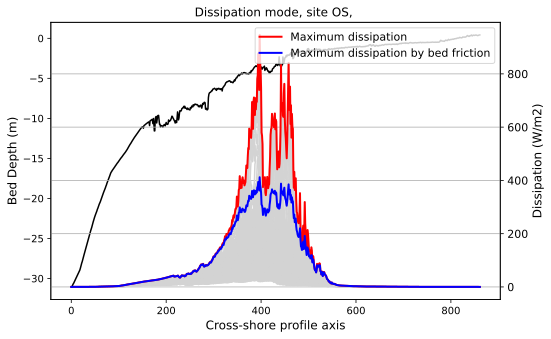

<Figure size 5120x3840 with 0 Axes>

Peak dissipation: 1511.435218047065
Mean dissipation: 12.537871199889423


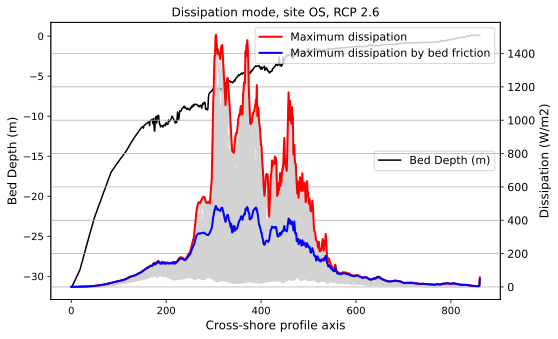

<Figure size 5120x3840 with 0 Axes>

Peak dissipation: 1966.8919731750814
Mean dissipation: 10.615916870194935


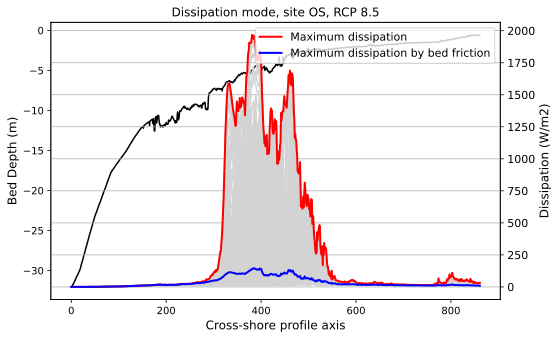

<Figure size 5120x3840 with 0 Axes>

Peak dissipation: 1340.9335335053468
Mean dissipation: 3.5877479848730833


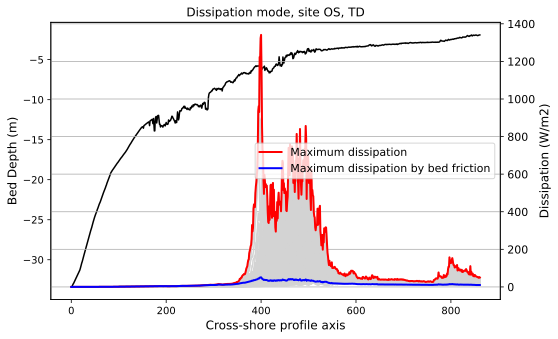

<Figure size 5120x3840 with 0 Axes>

In [17]:
plot_D_profile(OS_data, site = 'OS', scenario = 0, save = False)
plot_D_profile(OS_data, site = 'OS', scenario = 1, save = False)
plot_D_profile(OS_data, site = 'OS', scenario = 2, save = False)
plot_D_profile(OS_data, site = 'OS', scenario = 3, save = False)
OS_summary = pd.DataFrame()
OS_summary['Scenairo'] = ['PD','RCP2.6', 'RCP8.5', 'TD']
OS_summary['D_total'] = D_total
OS_summary['Df_total'] = Df_total


#plot_D_profile(OS_data, site = 'OS', scenario = 1, save = False)
#plot_D_profile(OS_data, site = 'OS', scenario = 2, save = False)
#plot_D_profile(OS_data, site = 'OS', scenario = 3, save = False)

In [18]:
OS_summary

,Scenairo,D_total,Df_total
0,PD,110.411692,74.704404
1,RCP2.6,295.382162,147.434839
2,RCP8.5,323.531007,35.619906
3,TD,125.876925,14.226851


Peak dissipation: 463.8538790428531
Mean dissipation: 2.5200937116585433


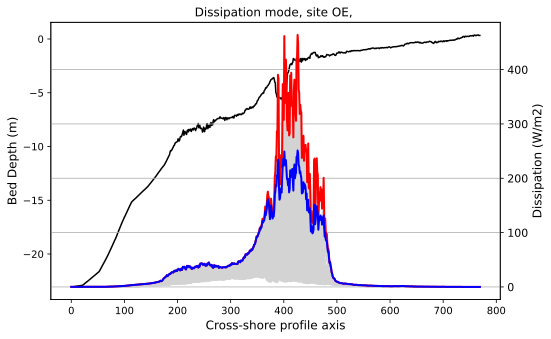

<Figure size 5120x3840 with 0 Axes>

Peak dissipation: 1473.4204219081698
Mean dissipation: 7.77750662601849


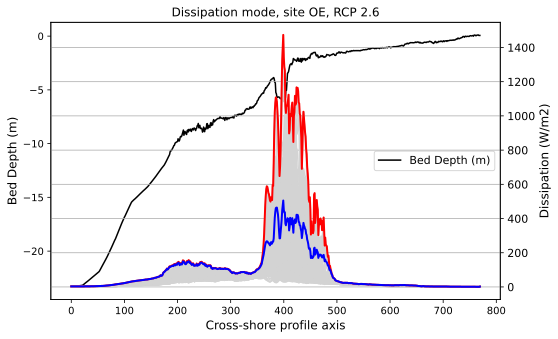

<Figure size 5120x3840 with 0 Axes>

Peak dissipation: 1824.7024279923407
Mean dissipation: 8.806238110681214


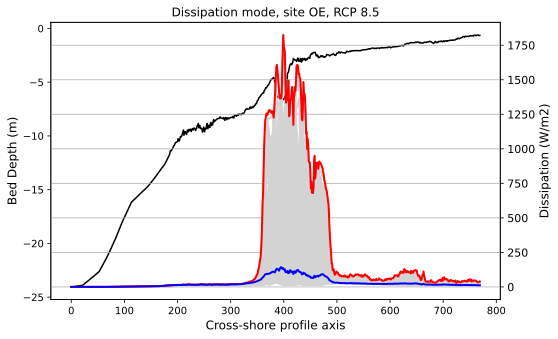

<Figure size 5120x3840 with 0 Axes>

Peak dissipation: 448.24215375128136
Mean dissipation: 1.2115101622485693


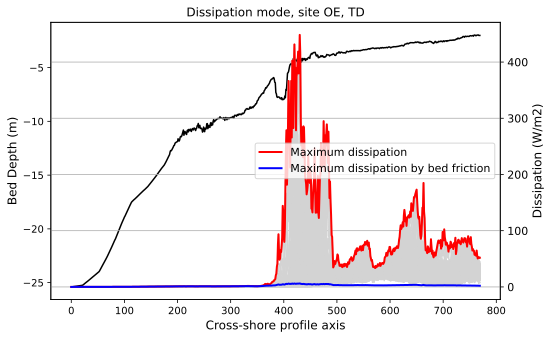

<Figure size 5120x3840 with 0 Axes>

In [20]:
plot_D_profile(OE_data, site = 'OE', scenario = 0, save = False)
plot_D_profile(OE_data, site = 'OE', scenario = 1)
plot_D_profile(OE_data, site = 'OE', scenario = 2)
plot_D_profile(OE_data, site = 'OE', scenario = 3)
OE_summary = pd.DataFrame()
OE_summary['Scenairo'] = ['PD','RCP2.6', 'RCP8.5', 'TD']
OE_summary['D_total'] = D_total
OE_summary['Df_total'] = Df_total

### Plot Energy and Dissipation on same plot

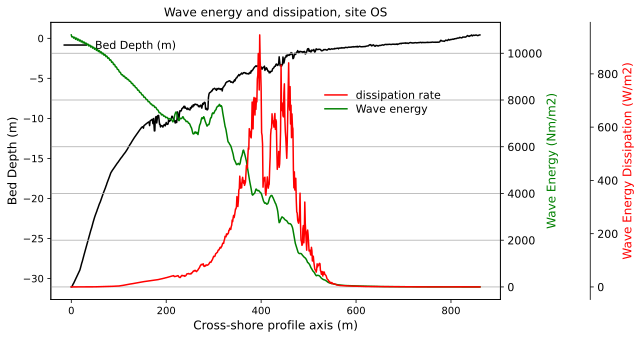

<Figure size 5120x3840 with 0 Axes>

In [29]:

    
def plot_E_profile(data, site = 'OS', save = True):
    
    data = data[0]
    d = data.variables['D'][:] + data.variables['Df'][:]
    df = data.variables['Df'][:]
    E = data.variables['E'][:]

    # Average over the time axis (axis 0)
    d_max = np.max(d, axis=0)
    df_max = np.max(df, axis=0)
    E_max = np.max(E, axis=0)

    # Get the number of y values
    num_y = d_mean.shape[0]

    # Create a list of x values
    x = np.arange(d_max.shape[1])
    x2 = np.arange(df_max.shape[1])  
    
    d_max_avg = np.max(d_max, axis=0)
    E_max_avg = np.max(E_max, axis=0)
    
    #Plot the bathy, time zero and midpoint is fine:
    yp = data.variables['zb'].shape[1]/2
    zb = data.variables['zb'][0,yp,:]


    fig, ax1 = plt.subplots(figsize=(10,5))
    fig.subplots_adjust(right=0.75)##
    ax2 = ax1.twinx()
    ax3 = ax1.twinx()
    
    ax2.plot(x, E_max_avg, 'green', label='Wave energy', linewidth=1.5)
    ax3.plot(x2, d_max_avg, 'red', label='dissipation rate', linewidth=1.5)
    #ax3.plot(np.max(Df, axis=0), 'blue', label='Dissipation due to friction (m)', linewidth=1.5, linestyle='dashed')


    ax2.set_ylabel('Wave Energy (Nm/m2)', size=12)
    ax2.yaxis.label.set_color('green')
    ax2.tick_params(axis='y', labelsize=11)
    
    ax3.set_ylabel('Wave Energy Dissipation (W/m2)', size=12)

    ax3.yaxis.label.set_color('red')
    ax3.tick_params(axis='y', labelsize=11)
    
    ax3.spines["right"].set_position(("axes", 1.2))
    make_patch_spines_invisible(ax3)
    ax3.spines["right"].set_visible(True)
    
    
    ax1.plot(zb, 'black', label='Bed Depth (m)', linewidth=1.5)

    ax1.set_xlabel('Cross-shore profile axis (m)', size=12)
    ax1.set_ylabel('Bed Depth (m)', size=12)
    ax1.tick_params(axis='x', labelsize=10)
    ax1.tick_params(axis='y', labelsize=10)

    ax1.legend(loc = (0.02,0.88), fontsize=11, frameon = False)
    ax2.legend( loc = (0.6, 0.65), fontsize=11, frameon = False)
    ax3.legend( loc = (0.6, 0.7), fontsize=11, frameon = False)
    
    
    
    
    ax2.grid()
    plt.title('Wave energy and dissipation, site %s'%site)
    
    
    if save:
       plt.savefig(r'C:\Users\lachl\OneDrive - The University of Sydney (Staff)\Writing\SAGS figs\%s_Energy.png'%(site))

    
    
    plt.figure(dpi=800)
    plt.show()

    
plot_E_profile(OS_data)

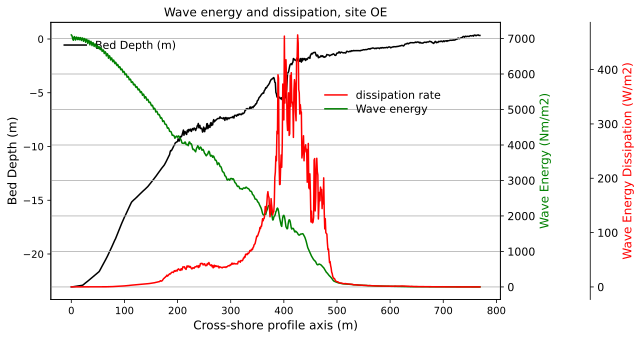

<Figure size 5120x3840 with 0 Axes>

In [30]:
plot_E_profile(OE_data, site = 'OE')